# object is a class!

object is NOT an instance of the object class. it is the class itself

type(object) --> type  (it is a class) <br>
type(Person) --> type 

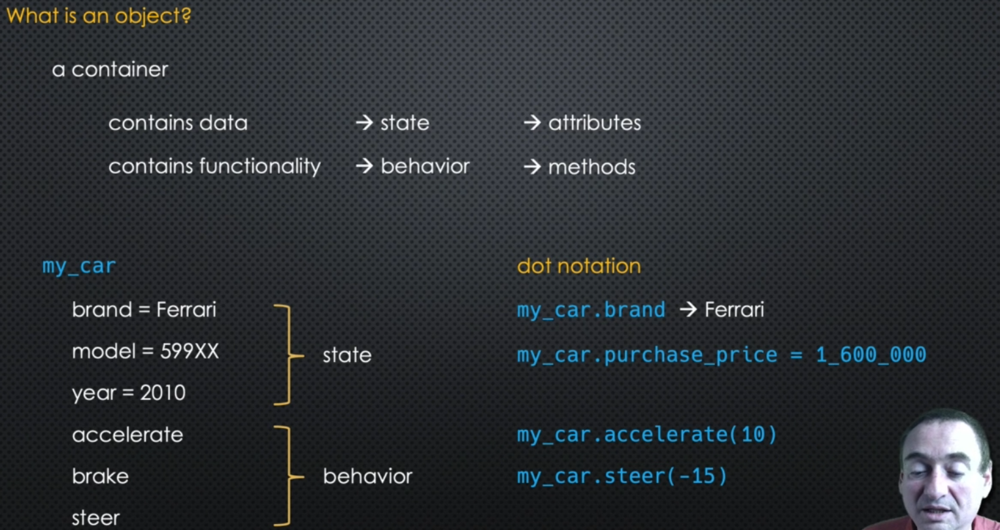

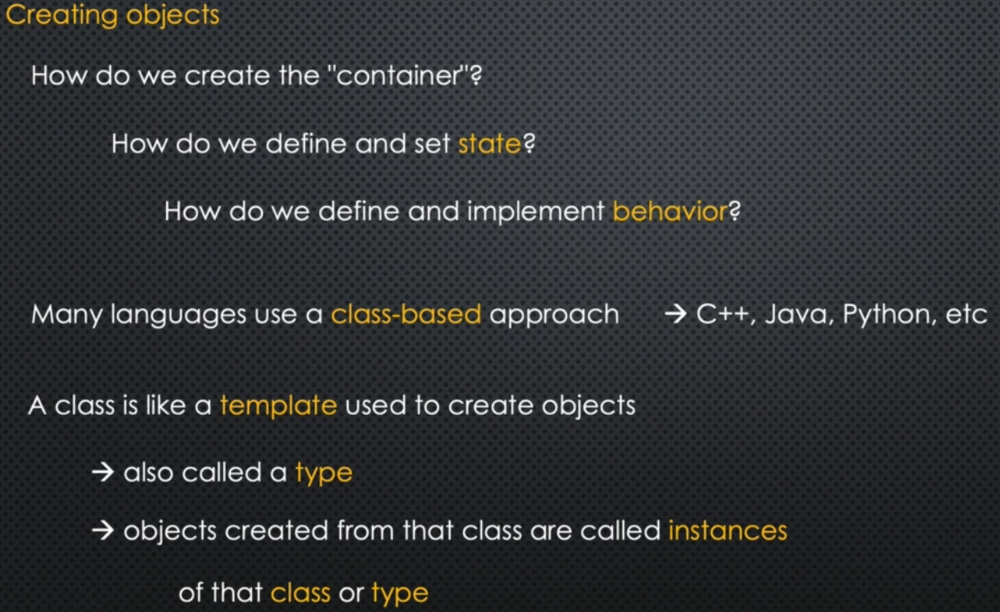

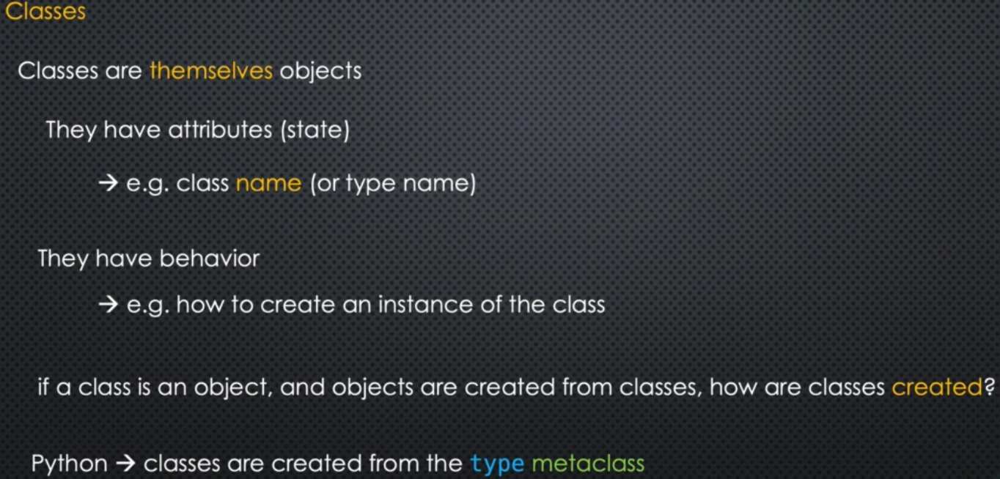

- The type of MyClass is type
- The type of instance of myClass is myClass

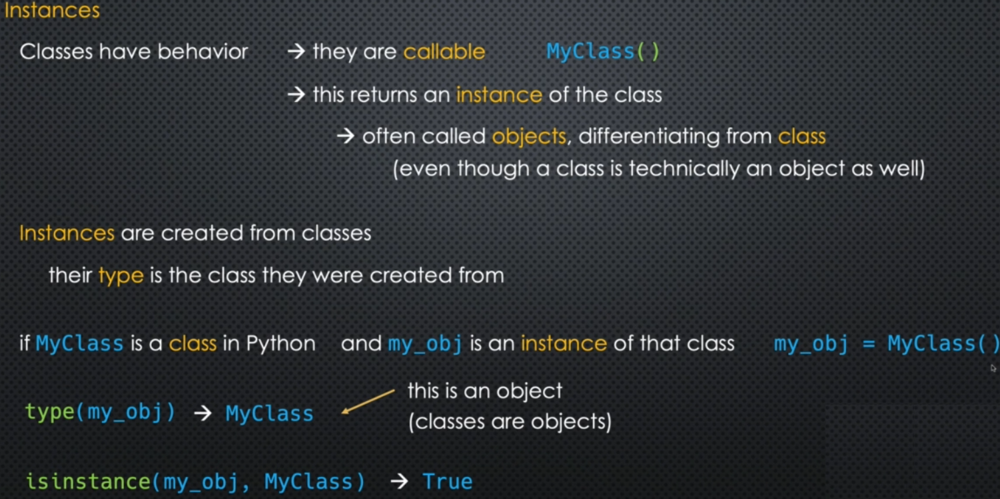

It creates the MyClass object!

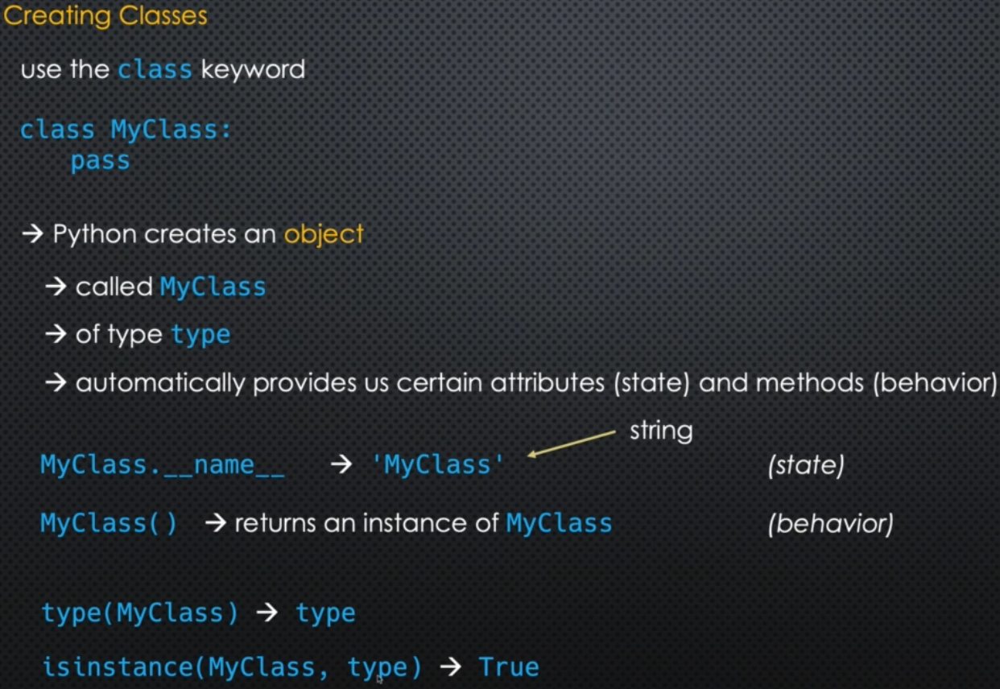

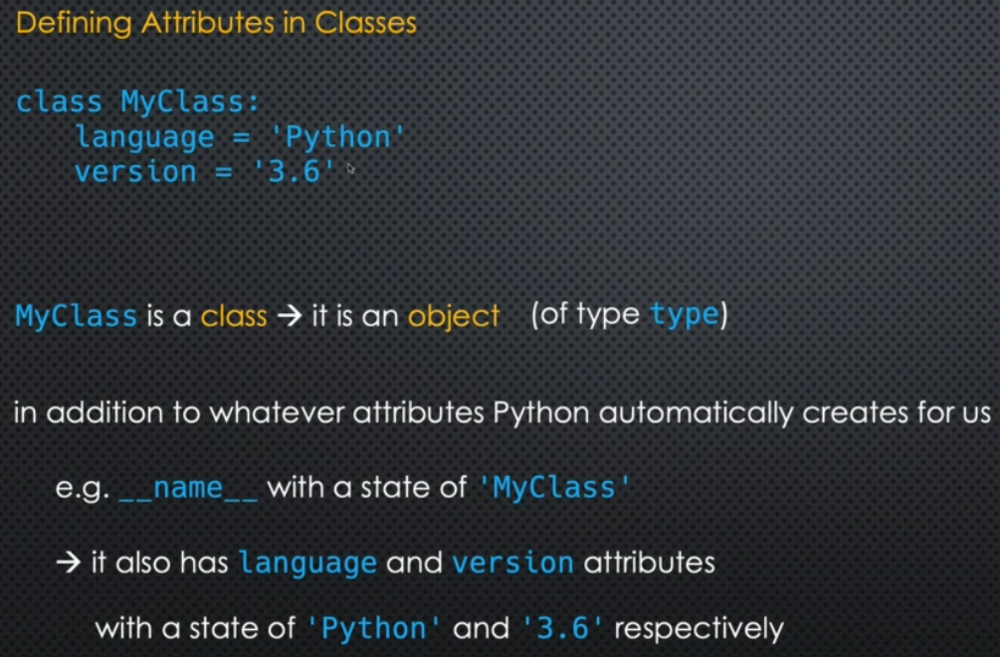

In [4]:
class Human():
    
    language='English'
    
    def __init__(self, hp=100, att=5, df=5):
        print('Human creature created with (hp={}, att={}, df={})'.format(hp,att,df))
        self.hp = hp
        self.att = att
        self.df = df
        
    def attack(self):
        print('Human attack deals {} dmg to target!'.format(self.att))
        
    def defend(self):
        print('Human defends {} incoming damage'.format(self.df))

In [8]:
getattr(Human, 'language')

'English'

In [9]:
getattr(Human, 'species', 'N/A')

'N/A'

In [5]:
type(Human)

type

In [6]:
type(type)

type

### instance.method(...) same as class.method(instance, ...)

In [9]:
h1 = Human()
h1.attack()

Human creature created with (hp=100, att=5, df=5)
Human attack deals 5 dmg to target!


In [10]:
h1 = Human()
Human.attack(h1)

Human creature created with (hp=100, att=5, df=5)
Human attack deals 5 dmg to target!


In [17]:
class Hero(Human):
    
    def __init__(self, hp, att, df, special):
        super().__init__(hp, att, df)  # same as super(Hero,self).__init__(hp,att,df)
        print('Hero created!')
        self.ability = special
        self.silenced = False
        
    def attack(self, special=None):
        if self.silenced:
            Human.attack(self)
        elif special:
            print('Hero attacks with {} dealing {} dmg to target!'.format(self.ability, self.att*2))
        else:
            print('Hero attack deals {} dmg to target!'.format(self.att))

In [18]:
p1 = Human(100,12,8)
p1.attack()

Human creature created with (hp=100, att=12, df=8)
Human attack deals 12 dmg to target!


In [19]:
h1 = Hero(100,20,15, 'blizzard')

Human creature created with (hp=100, att=20, df=15)
Hero created!


In [20]:
h1.attack()

Hero attack deals 20 dmg to target!


In [21]:
h1.attack(special=True)

Hero attacks with blizzard dealing 40 dmg to target!


In [22]:
h1.silenced = True
h1.attack()

Human attack deals 20 dmg to target!


### We do not have to define __init__() if the object doesn't do anything differently that the object that inherits from

In [25]:
class HumanV2(Human):
    '''
    We do not have to define __init__() if the object doesn't 
    do anything differently that the object that inherits from
    '''
    pass

In [26]:
ht = HumanV2()

Human creature created with (hp=100, att=5, df=5)


In [28]:
HumanV2.mro()

[__main__.HumanV2, __main__.Human, object]

In [30]:
class HumanV3(Human):
    '''
    We do not have to define __init__() if the object doesn't 
    do anything differently that the object that inherits from
    '''
    def attack(self, mad=0):
        if mad:
            print('Human BERSERKS deals {} dmg to target!'.format(1.5*self.att))
        else:
            print('HumanV3')
            print('Human attack deals {} dmg to target!'.format(self.att))

In [31]:
h3 = HumanV3()

Human creature created with (hp=100, att=5, df=5)


In [33]:
h3.attack()

HumanV3
Human attack deals 5 dmg to target!


In [34]:
h3.attack(mad=1)

Human BERSERKS deals 7.5 dmg to target!


In [35]:
class Animal():
    def __init__(self,name):
        self.name = name
        
    def speak(self):
        raise NotImplementedError("Subclass must implement this abstract method!")
        # To force to be overriden in subclass

In [36]:
my_animal = Animal('fred')
my_animal.speak()

NotImplementedError: Subclass must implement this abstract method!

In [37]:
class Dog(Animal):
    
    def speak(self):
        return self.name + " says woof!"
    
class Cat(Animal):
    
    def speak(self):
        return self.name + " says meow!"

In [38]:
fido = Dog("Fido")
isis = Cat("Isis")

In [39]:
print(fido.speak())
print(isis.speak())

Fido says woof!
Isis says meow!


### Polymorphism

In [40]:
def pet_speak(pet):
    print(pet.speak())

In [41]:
pet_speak(fido)

Fido says woof!


In [42]:
pet_speak(isis)

Isis says meow!


### Real-life example to use Polymorphism
- Open different files (word, pdf, excel etc..) types using 'open'
- Make a class that will be the base class for opening files
- THen you have other classes that inherit from it to open csv's, excels, words, etc...

### Use built in function like len(), print() with your own objects
### dunder methods (magic methods)

In [43]:
class Book():
    
    def __init__(self, title, author, pages):
        
        self.title = title
        self.author = author
        self.pages = pages

In [44]:
b = Book('Python', 'Theo', 200)
print(b)  #string representation of object

In [51]:
class Book():
    
    def __init__(self, title, author, pages):
        
        self.title = title
        self.author = author
        self.pages = pages
        
    # string representation for print for example
    def __str__(self):
        return "{} by {}".format(self.title,self.author)
        #return f"{self.title} by {self.author}"   #What it doesn't work??
        
    
    # length
    def __len__(self):
        return self.pages
    
    
    #Things to occur while deleting object
    def  __del__(self):
        print("Book object deleted")

In [52]:
b = Book('Python', 'Theo', 200)
print(b)  #string representation of object

Python by Theo


In [53]:
len(b)

200

In [54]:
del b

Book object deleted


In [55]:
b

NameError: name 'b' is not defined

In [1]:
class Animal:
    def __init__(self):
        print('Animal instantiated!')
        
a = Animal()
a.__dict__

Animal instantiated!


{}

In [2]:
getattr(a, 'feet', 4)

4

In [3]:
a.__dict__

{}

In [5]:
a.feet = 4
a.__dict__

{'feet': 4}

In [6]:
Animal.__dict__

mappingproxy({'__dict__': <attribute '__dict__' of 'Animal' objects>,
              '__doc__': None,
              '__init__': <function __main__.Animal.__init__(self)>,
              '__module__': '__main__',
              '__weakref__': <attribute '__weakref__' of 'Animal' objects>})